##### _

In [1]:

# Data generation function - this is not part of the task, and is only to simulate pulling from a SQL database
# Don't worry about changing this - it's just to make the notebook a little easier!
import pandas as pd
import numpy as np
from sklearn.datasets import make_classification
from sklearn.preprocessing import MinMaxScaler

def collect_from_database(query: str) -> pd.DataFrame:
    print(f"Executing: {query}")
    n_rows = 10_000
    n_features = 16
    features, labels = make_classification(
        n_samples = n_rows,
        n_features = 16,
        n_informative = 7,
        n_redundant = 4,
        n_repeated = 3,
        n_classes = 2,
        class_sep = 1.2,
        flip_y = 0.035, # Randomly invert y for added noise
        weights = [0.85,0.15],
        random_state = 1889,
    )
    df = pd.DataFrame(features, columns=[f'numeric_{i+1}' for i in range(n_features)])
    df.insert(value=labels, loc=0, column='claim_status')
    df = df.rename(columns={
        'numeric_1': 'age',
        'numeric_2': 'height_cm',
        'numeric_3': 'weight_kg',
        'numeric_4': 'income',
        'numeric_5': 'financial_hist_1',
        'numeric_6': 'financial_hist_2',
        'numeric_7': 'financial_hist_3',
        'numeric_8': 'financial_hist_4',
        'numeric_9': 'credit_score_1',
        'numeric_10': 'credit_score_2',
        'numeric_11': 'credit_score_3',
        'numeric_12': 'insurance_hist_1',
        'numeric_13': 'insurance_hist_2',
        'numeric_14': 'insurance_hist_3',
        'numeric_15': 'insurance_hist_4',
        'numeric_16': 'insurance_hist_5',
    })
    df['age'] = MinMaxScaler(feature_range=(18, 95)).fit_transform(df['age'].values[:, None])
    df['age'] = df['age'].astype('int')
    df['height_cm'] = MinMaxScaler(feature_range=(140, 210)).fit_transform(df['height_cm'].values[:, None])
    df['height_cm'] = df['height_cm'].astype('int')
    df['weight_kg'] = MinMaxScaler(feature_range=(45, 125)).fit_transform(df['weight_kg'].values[:, None])
    df['weight_kg'] = df['weight_kg'].astype('int')
    df['income'] = MinMaxScaler(feature_range=(0, 250_000)).fit_transform(df['income'].values[:, None])
    df['income'] = df['income'].astype('int')
    df['credit_score_1'] = MinMaxScaler(feature_range=(0, 999)).fit_transform(df['credit_score_1'].values[:, None])
    df['credit_score_1'] = df['credit_score_1'].astype('int')
    df['credit_score_2'] = MinMaxScaler(feature_range=(0, 700)).fit_transform(df['credit_score_2'].values[:, None])
    df['credit_score_2'] = df['credit_score_2'].astype('int')
    df['credit_score_3'] = MinMaxScaler(feature_range=(0, 710)).fit_transform(df['credit_score_3'].values[:, None])
    df['credit_score_3'] = df['credit_score_3'].astype('int')
    df['bmi'] = (df['weight_kg']/((df['height_cm']/100)**2)).astype('int')
    df['gender'] = np.where(
        df['claim_status'] == 0,
        np.random.choice([1, 0], size=(n_rows), p=[0.46, 0.54]),
        np.random.choice([1, 0], size=(n_rows), p=[0.52, 0.48])
        )
    df['marital_status'] = np.random.choice(['A', 'B', 'C', 'D', 'E', 'F'], size=(n_rows), p=[0.2, 0.15, 0.1, 0.25, 0.15, 0.15])
    df['occupation'] = np.random.choice(['A', 'B', 'C', 'D', 'E', 'F', 'G'], size=(n_rows))
    df['location'] = np.random.choice(list(string.ascii_uppercase), size=(n_rows))
    df['prev_claim_rejected'] = np.where(
        df['claim_status'] == 0,
        np.random.choice([1, 0], size=(n_rows), p=[0.08, 0.92]),
        np.random.choice([1, 0], size=(n_rows), p=[0.16, 0.84])
        )
    df['known_health_conditions'] = np.random.choice([1, 0], size=(n_rows), p=[0.06, 0.94])
    df['uk_residence'] = np.random.choice([1, 0], size=(n_rows), p=[0.76, 0.24])
    df['family_history_1'] = np.random.choice([1, 0], size=(n_rows), p=[0.22, 0.78])
    df['family_history_2'] = np.random.choice([1, 0], size=(n_rows), p=[0.25, 0.75])
    df['family_history_3'] = np.random.choice([1, None, 0], size=(n_rows), p=[0.12, 0.81, 0.07])
    df['family_history_4'] = np.random.choice([1, 0], size=(n_rows), p=[0.27, 0.73])
    df['family_history_5'] = np.random.choice([1, 0], size=(n_rows), p=[0.31, 0.69])
    df['product_var_1'] = np.random.choice([1, 0], size=(n_rows), p=[0.38, 0.62])
    df['product_var_2'] = np.random.choice([1, 0], size=(n_rows), p=[0.55, 0.45])
    df['product_var_3'] = np.random.choice(['A', 'B', 'C', 'D'], size=(n_rows), p=[0.23, 0.28, 0.31, 0.18])
    df['product_var_4'] = np.random.choice([1, 0], size=(n_rows), p=[0.76, 0.24])
    df['health_status'] = np.random.randint(1, 5, size=(n_rows))
    df['driving_record'] = np.random.randint(1, 5, size=(n_rows))
    df['previous_claim_rate'] = np.where(
        df['claim_status'] == 0,
        np.random.choice([1, 2, 3, 4, 5], size=(n_rows), p=[0.48, 0.29, 0.12, 0.08, 0.03]),
        np.random.choice([1, 2, 3, 4, 5], size=(n_rows), p=[0.12, 0.28, 0.34, 0.19, 0.07]),
    )
    df['education_level'] = np.random.randint(0, 7, size=(n_rows))
    df['income level'] = pd.cut(df['income'], bins=5, labels=False, include_lowest=True)
    df['n_dependents'] = np.random.choice(
        [1, 2, 3, 4, 5], size=(n_rows), p=[0.23, 0.32, 0.27, 0.11, 0.07]
    )
    df['employment_type'] = np.random.choice(
        [1, None, 0], size=(n_rows), p=[0.16, 0.7, 0.14]
    )
    return df

# **Pre-selection Task:** Alex's Notebook

### Imports

pan??

In [2]:
import pandas as pan
import numpy as np
from scipy import stats
from sklearn.datasets import *
from sklearn.metrics import cohen_kappa_score, accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, roc_auc_score, confusion_matrix, log_loss, roc_curve
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns
import string
import shap

#Seed
np.random.seed(1889)

### Data Collection

In [3]:
account_name = "rg_data_sci"
client_id = "a1b2c3d4"
client_secret = "b1c2d3e4" #Delete before commiting to ADO!!!
subscription_id = "8a7b6c5d"
tenant_id = "6f5g4h3i"
datalake_name = "rg_data_lake"

In [4]:
dataset_from_database = collect_from_database(
    "SELECT * FROM CLAIMS.DS_DATASET"
)
dataset_from_database.head(10)

Executing: SELECT * FROM CLAIMS.DS_DATASET


,claim_status,age,height_cm,weight_kg,income,financial_hist_1,financial_hist_2,financial_hist_3,financial_hist_4,credit_score_1,...,product_var_2,product_var_3,product_var_4,health_status,driving_record,previous_claim_rate,education_level,income level,n_dependents,employment_type
0,0,49,182,80,155292,1.408797,-0.573517,-0.464914,3.249624,519,...,0,A,0,3,2,1,2,3,1,0
1,0,55,185,86,169232,2.402368,1.135213,0.780797,3.075214,500,...,1,C,1,2,4,3,2,3,2,None
2,0,55,169,82,173856,-1.182139,0.337877,1.754185,1.932426,422,...,0,C,1,4,1,1,2,3,2,1
3,0,43,179,76,150264,1.107481,-1.123652,1.966727,-0.130857,297,...,1,D,1,4,1,1,0,3,2,None
4,0,56,167,86,118449,-0.985055,-0.604696,-0.650367,-1.329931,440,...,1,B,1,3,3,1,0,2,1,None
5,0,47,184,89,147966,-0.532343,1.668309,1.672834,1.083610,423,...,1,B,1,2,3,1,3,2,5,None
6,0,58,161,64,124218,-1.594298,-0.059563,-2.565507,-1.216361,392,...,0,A,1,2,1,1,2,2,3,None
7,0,55,170,96,109517,-0.867955,-1.461820,-0.543154,-1.298344,430,...,0,A,1,1,3,1,5,2,2,0
8,0,55,166,87,182091,-2.868900,-0.193578,2.230964,2.590524,349,...,0,D,1,1,2,2,5,3,3,1
9,0,52,166,78,171201,-2.935281,1.091528,1.392789,2.102653,417,...,1,B,0,1,2,1,5,3,5,None


In [5]:
print(dataset_from_database.shape)

(10000, 41)


In [6]:
# Check distribution of labels
dataset_from_database['claim_status'].value_counts()

0    8397
1    1603
Name: claim_status, dtype: int64

Clear class imbalance in the data.

In [7]:
# optionally save CSV locally

# dataset_from_database.to_csv("dataset_from_database.csv")

### Data Wrangling

In [8]:
# Calculating total and % missing Values
total = dataset_from_database.isnull().sum()
percent = (dataset_from_database.isnull().sum() / dataset_from_database.isnull().count()*100)

# Creating a DataFrame for Missing Values
missing_df = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])

# Obtain the dtpyes of each columns
types = []
for col in dataset_from_database.columns:
    dtype = str(dataset_from_database[col].dtype)
    types.append(dtype)
missing_df['Types'] = types

In [9]:
print(missing_df)
print(dataset_from_database.info())

                         Total  Percent    Types
claim_status                 0     0.00    int64
age                          0     0.00    int64
height_cm                    0     0.00    int64
weight_kg                    0     0.00    int64
income                       0     0.00    int64
financial_hist_1             0     0.00  float64
financial_hist_2             0     0.00  float64
financial_hist_3             0     0.00  float64
financial_hist_4             0     0.00  float64
credit_score_1               0     0.00    int64
credit_score_2               0     0.00    int64
credit_score_3               0     0.00    int64
insurance_hist_1             0     0.00  float64
insurance_hist_2             0     0.00  float64
insurance_hist_3             0     0.00  float64
insurance_hist_4             0     0.00  float64
insurance_hist_5             0     0.00  float64
bmi                          0     0.00    int64
gender                       0     0.00    int64
marital_status      

An action is required for family_history_3 and employment_type, removal is easiest but imputation could also be an option.

We also have four additional variables with object dtypes to be correct.

In [10]:
dataset_from_database[["marital_status", "occupation", "location", "product_var_3"]] = dataset_from_database[["marital_status", "occupation", "location", "product_var_3"]].astype('category')

In [11]:
# Creating a DataFrame without specific columns
# dataset_from_database_no_missing_values = pd.DataFrame()
# dataset_from_database_no_missing_values = dataset_from_database.drop(columns=['family_history_3', 'employment_type'])
dataset_from_database.drop(columns=['family_history_3', 'employment_type'], inplace=True)

# Drop variables following correlation
dataset_from_database.drop(columns=['financial_hist_1', 'insurance_hist_1', 'insurance_hist_2', 'bmi'], inplace=True)

In [12]:
for i in dataset_from_database.columns:
    print(f"Column: {i}, dtype: {dataset_from_database[i].dtype}")

Column: claim_status, dtype: int64
Column: age, dtype: int64
Column: height_cm, dtype: int64
Column: weight_kg, dtype: int64
Column: income, dtype: int64
Column: financial_hist_2, dtype: float64
Column: financial_hist_3, dtype: float64
Column: financial_hist_4, dtype: float64
Column: credit_score_1, dtype: int64
Column: credit_score_2, dtype: int64
Column: credit_score_3, dtype: int64
Column: insurance_hist_3, dtype: float64
Column: insurance_hist_4, dtype: float64
Column: insurance_hist_5, dtype: float64
Column: gender, dtype: int64
Column: marital_status, dtype: category
Column: occupation, dtype: category
Column: location, dtype: category
Column: prev_claim_rejected, dtype: int64
Column: known_health_conditions, dtype: int64
Column: uk_residence, dtype: int64
Column: family_history_1, dtype: int64
Column: family_history_2, dtype: int64
Column: family_history_4, dtype: int64
Column: family_history_5, dtype: int64
Column: product_var_1, dtype: int64
Column: product_var_2, dtype: int64

Next we also have some other categorical variables to define:

In [13]:
non_numerical = ['gender', 'prev_claim_rejected', 'known_health_conditions', 'uk_residence', 'family_history_1', 'family_history_2', 'family_history_4', 'family_history_5', 'product_var_1', 'product_var_2', 'product_var_3', 'health_status', 'driving_record', 'previous_claim_rate', 'education_level', 'income level', 'n_dependents']

for column in non_numerical:
    dataset_from_database[column] = dataset_from_database[column].astype('category')

In [14]:
print(dataset_from_database.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 35 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   claim_status             10000 non-null  int64   
 1   age                      10000 non-null  int64   
 2   height_cm                10000 non-null  int64   
 3   weight_kg                10000 non-null  int64   
 4   income                   10000 non-null  int64   
 5   financial_hist_2         10000 non-null  float64 
 6   financial_hist_3         10000 non-null  float64 
 7   financial_hist_4         10000 non-null  float64 
 8   credit_score_1           10000 non-null  int64   
 9   credit_score_2           10000 non-null  int64   
 10  credit_score_3           10000 non-null  int64   
 11  insurance_hist_3         10000 non-null  float64 
 12  insurance_hist_4         10000 non-null  float64 
 13  insurance_hist_5         10000 non-null  float64 
 14  gender 

### EDA

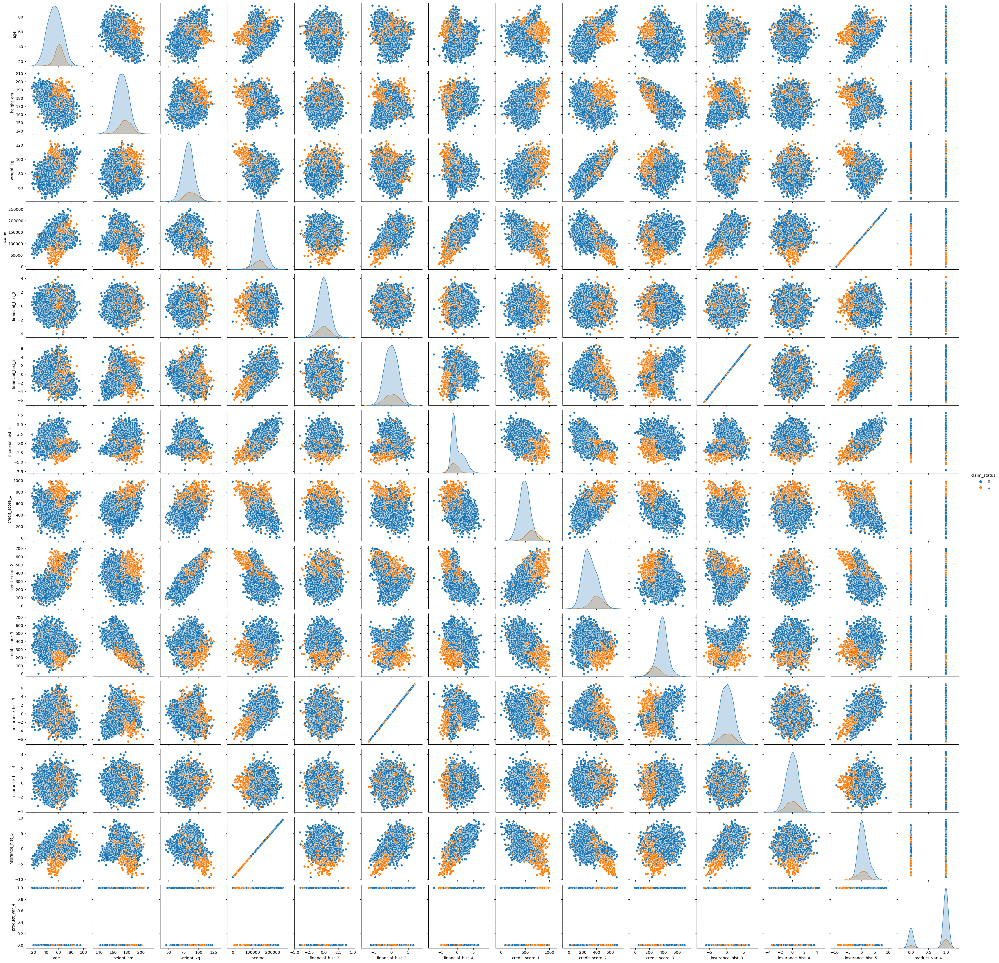

In [15]:
sns.pairplot(dataset_from_database, hue='claim_status')

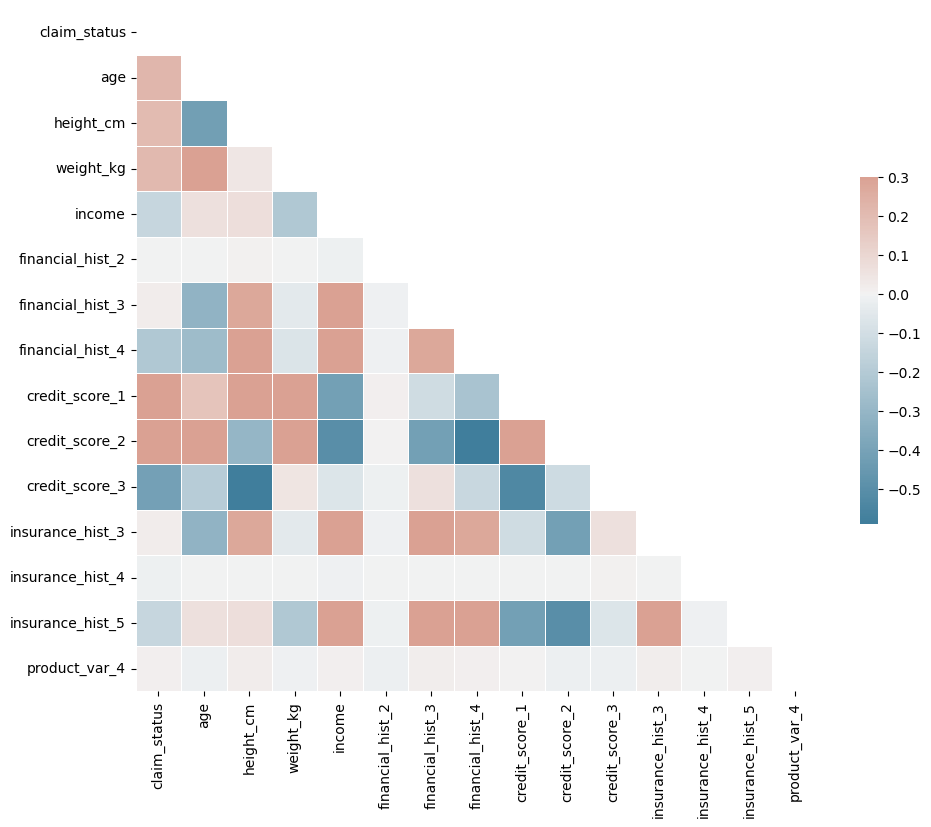

In [16]:
corr = dataset_from_database[
    dataset_from_database.columns.drop(["product_var_3", "marital_status", "occupation", "location"])
].corr()
diag_mask = np.triu(np.ones_like(corr, dtype=bool))

# Create axes and colourmap
fig, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(
    corr,
    mask=diag_mask,
    cmap=cmap,
    vmax=0.3,
    center=0,
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.5},
)

plt.show()

Large negative correlations for:

- credit_score_3 with insurance_hist_2
- credit_score_3 with insurance_hist_1
- financial_hist_1 with credit_score_3
- height_cm with bmi
- insurance_hist_1 with bmi

These should be dealt with before modelling.

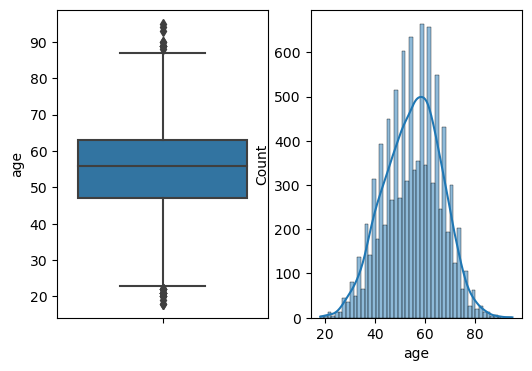

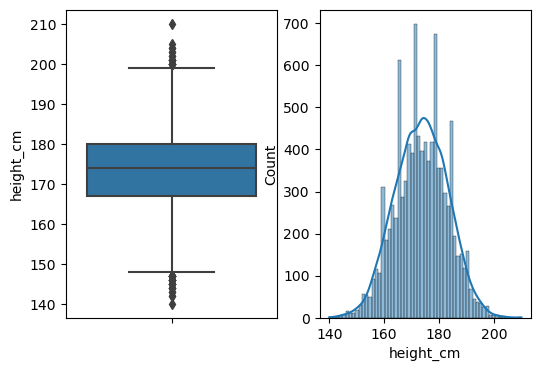

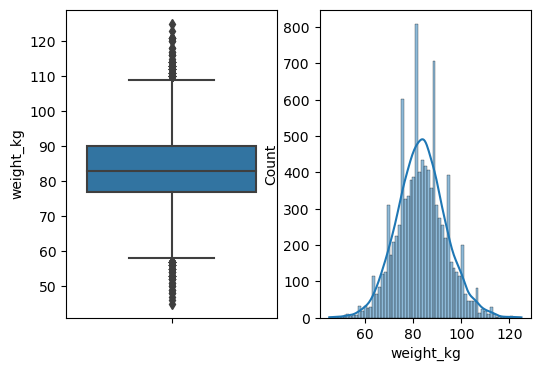

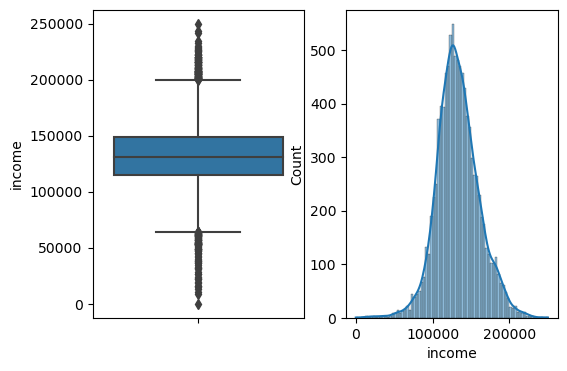

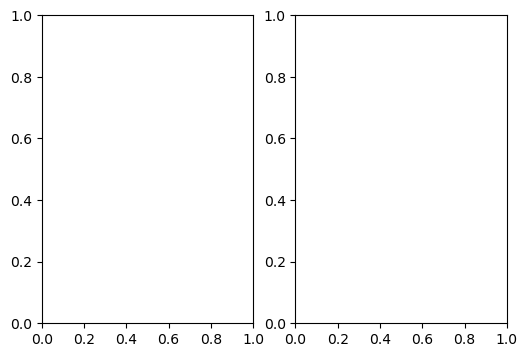

...

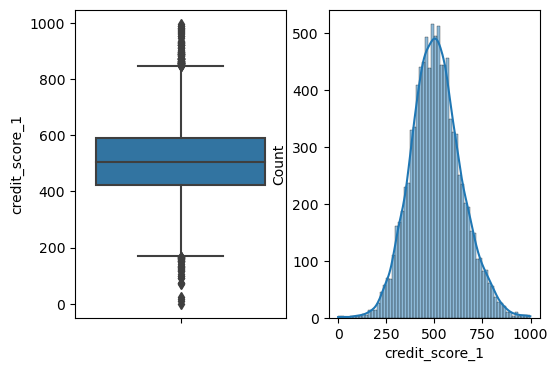

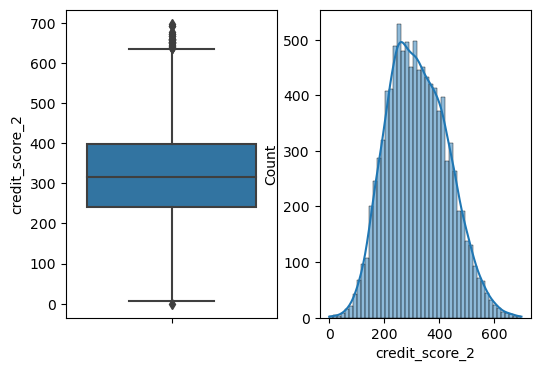

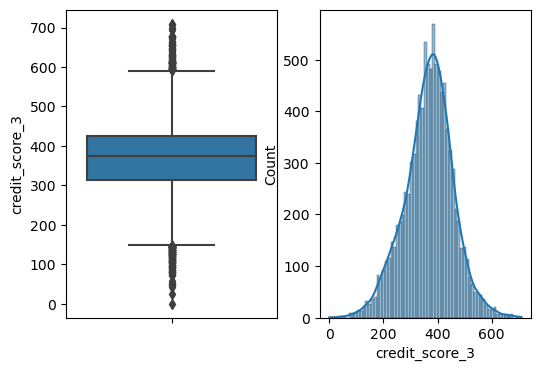

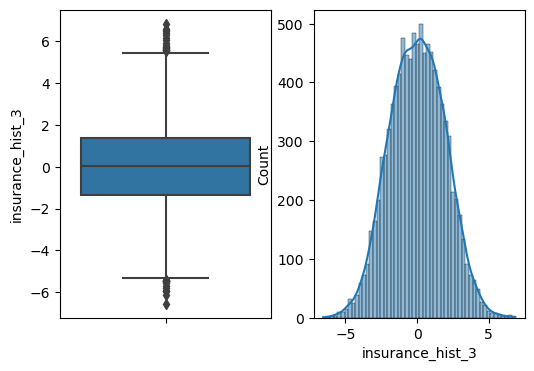

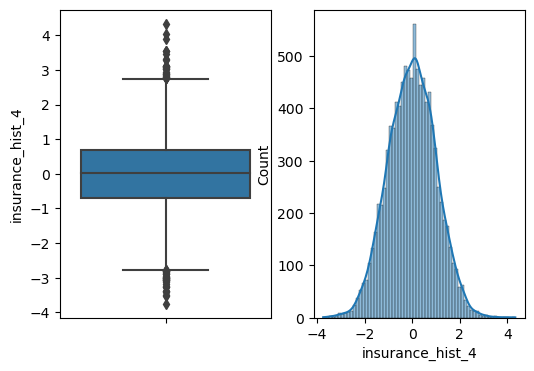

In [20]:
for column in ['age', 'height_cm', 'weight_kg', 'income', 'financial_hist_2', 'financial_hist_3', 'financial_hist_4','credit_score_1', 'credit_score_2', 'credit_score_3', 'insurance_hist_3', 'insurance_hist_4']:
    fig, ax = plt.subplots(1, 2, figsize=(6,4))
    sns.boxplot(data=dataset_from_database, y = column, orient='v', ax=ax[0])
    sns.histplot(dataset_from_database, x = column, kde=True, ax=ax[1])

plt.show()

Almost all distributions show the presence of outliers. Lets see if they are handled further down ...

In [23]:
column_plots = dataset_from_database.columns.drop(['claim_status', 'financial_hist_2', 'financial_hist_3', 'financial_hist_4', 'insurance_hist_3', 'insurance_hist_4', 'insurance_hist_5', 'income'])

ROC Curve suggests amazing performance - espeically for an initial model! easier than expected

### Initial Model Training

In [24]:
# Separate the Dataframe into labels and features
X, y = dataset_from_database.drop('claim_status', axis=1), dataset_from_database[['claim_status']]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1889)

# Build the evaluation set & metric list
eval_set = [(X_train, y_train)]
eval_metrics = ['auc', 'rmse', 'logloss']

### CV Model Training
- Cross Vaildation tests to see if I can improve the model performance - not sure if it's useful

In [25]:
from sklearn.utils import class_weight
classes_weights = class_weight.compute_sample_weight(
    class_weight="balanced",
    y=y_train
)

In [26]:
parameter_gridSearch = RandomizedSearchCV(
    estimator=xgb.XGBClassifier(
    objective='binary:logistic',
    eval_metric=eval_metrics,
    early_stopping_rounds=15,
    enable_categorical=True
    ),

    param_distributions={
    'n_estimators': stats.randint(50, 500),
    'learning_rate': stats.uniform(0.01, 0.75),
    'subsample': stats.uniform(0.25, 0.75),
    'max_depth': stats.randint(1, 8),
    'colsample_bytree': stats.uniform(0.1, 0.75),
    'min_child_weight': [1, 3, 5, 7, 9],
    },

    cv=5,
    n_iter=100,
    verbose=False,
    scoring='roc_auc',
)

parameter_gridSearch.fit(X_train, y_train, eval_set=eval_set, sample_weight=classes_weights, verbose=False)

print("Best parameters are: ", parameter_gridSearch.best_params_)

Best parameters are:  {'colsample_bytree': 0.48352462439768884, 'learning_rate': 0.07665492035350953, 'max_depth': 7, 'min_child_weight': 3, 'n_estimators': 72, 'subsample': 0.9748036805265692}


In [27]:
model3 = xgb.XGBClassifier(
    objective='binary:logistic',
    eval_metric=eval_metrics,
    early_stopping_rounds=15,
    enable_categorical=True,
    **parameter_gridSearch.best_params_ #Not sure what this does, from StackOverflow
    )

model3.fit(X_train, y_train, eval_set=eval_set, sample_weight=classes_weights, verbose=False)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.48352462439768884, device=None,
              early_stopping_rounds=15, enable_categorical=True,
              eval_metric=['auc', 'rmse', 'logloss'], feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.07665492035350953,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=72, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

### Model Evaluation

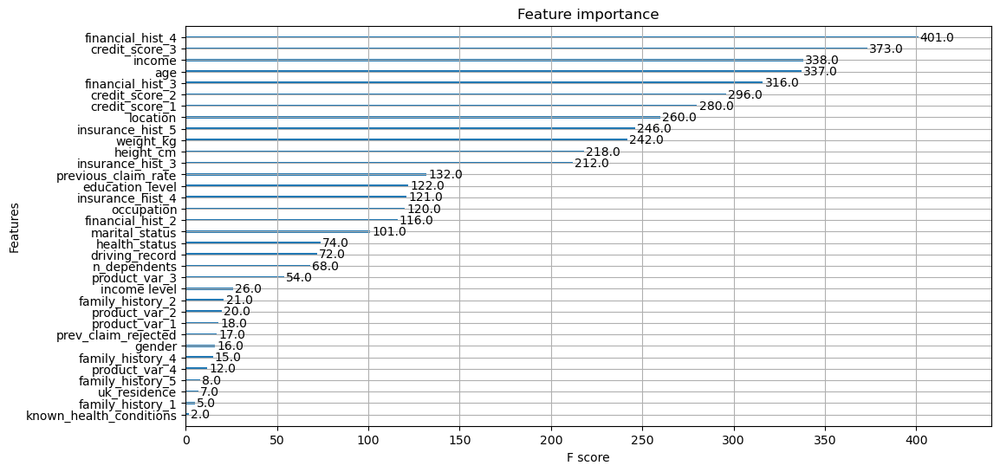

In [28]:
fig1, ax1 = plt.subplots(figsize=(12, 6))
xgb.plot_importance(model3, ax=ax1)
plt.show()

Should drop financial_hist_1, insurance_hist_1, insurance_hist_2, bmi following correlation

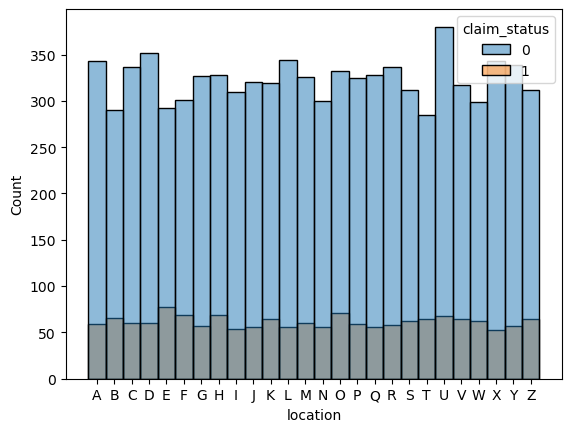

In [29]:
sns.histplot(data=dataset_from_database,x="location",hue="claim_status")
plt.show()

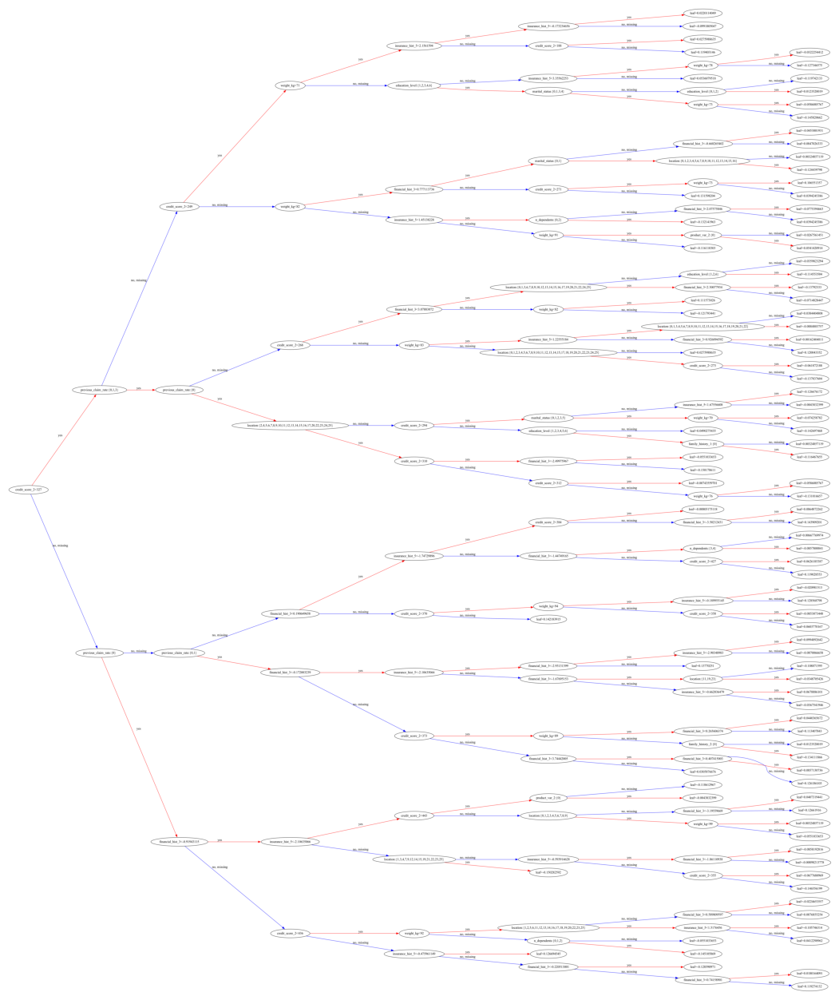

In [30]:
fig2, ax2 = plt.subplots(figsize=(16,16))
xgb.plot_tree(model3, rankdir='LR', ax=ax2)
plt.show()

In [34]:
from sklearn.metrics import cohen_kappa_score, accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, roc_auc_score, confusion_matrix, log_loss, roc_curve

train_class_preds2 = model3.predict(X_train)
test_class_preds2 = model3.predict(X_test)
train_prob_preds2 = model3.predict_proba(X_train)[:, 1]
test_prob_preds2 = model3.predict_proba(X_test)[:, 1]

y = np.array(y_train)
y = y.astype(int)
yhat = np.array(train_class_preds2)
yhat = np.clip(np.round(yhat), np.min(y), np.max(y)).astype(int)
kappa2 = round(cohen_kappa_score(yhat, y, weights='quadratic'), 2)
print(f"The Cohen Kappa score on the training data is: {kappa2}")

y = np.array(y_test)
y = y.astype(int)
yhat = np.array(test_class_preds2)
yhat = np.clip(np.round(yhat), np.min(y), np.max(y)).astype(int)
kappa2 = round(cohen_kappa_score(yhat, y, weights='quadratic'), 2)
print(f"The Cohen Kappa score on the test data is: {kappa2}")

print("The accuracy on train dataset is: ", accuracy_score(y_train, train_class_preds2))
print("The accuracy on test dataset is: ", accuracy_score(y_test, test_class_preds2))
print("Train confusion matrix: ", confusion_matrix(y_train, train_class_preds2))
print("Test confusion matrix: ", confusion_matrix(y_test, test_class_preds2))
print("ROC on train data: ", roc_auc_score(y_train, train_prob_preds2))
print("ROC on test data: ", roc_auc_score(y_test, test_prob_preds2))
print("Train log loss: ", log_loss(y_train, train_prob_preds2))
print("Test log loss: ", log_loss(y_test, test_prob_preds2))
print("Train F1 score is: ", f1_score(y_train, train_class_preds2))
print("Test F1 score is: ", f1_score(y_test, test_class_preds2))
print("Train Precision is: ", precision_score(y_train, train_class_preds2))
print("Test Precision is: ", precision_score(y_test, test_class_preds2))
print("Train Recall is: ", recall_score(y_train, train_class_preds2))
print("Test Recall is: ", recall_score(y_test, test_class_preds2))

The Cohen Kappa score on the training data is: 0.95
The Cohen Kappa score on the test data is: 0.82
The accuracy on train dataset is:  0.987625
The accuracy on test dataset is:  0.9505
Train confusion matrix:  [[6636   92]
 [   7 1265]]
Test confusion matrix:  [[1624   45]
 [  54  277]]
ROC on train data:  0.9986986469761215
ROC on test data:  0.9601150534267132
Train log loss:  0.09354355832812143
Test log loss:  0.15811412869137711
Train F1 score is:  0.9623430962343096
Test F1 score is:  0.8483920367534458
Train Precision is:  0.9322033898305084
Test Precision is:  0.860248447204969
Train Recall is:  0.9944968553459119
Test Recall is:  0.8368580060422961


In [ ]:
fpr, tpr, _ = roc_curve(y_test, test_prob_preds2)
random_fpr, random_tpr, _ = roc_curve(y_test, [0 for _ in range(len(y_test))])
fig, ax = plt.subplots(figsize=(8,6))
plt.plot(fpr, tpr, marker='.', label='XGBoost')
plt.plot(random_fpr, random_tpr, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver Operating Curve")
plt.show()

### Shap Values

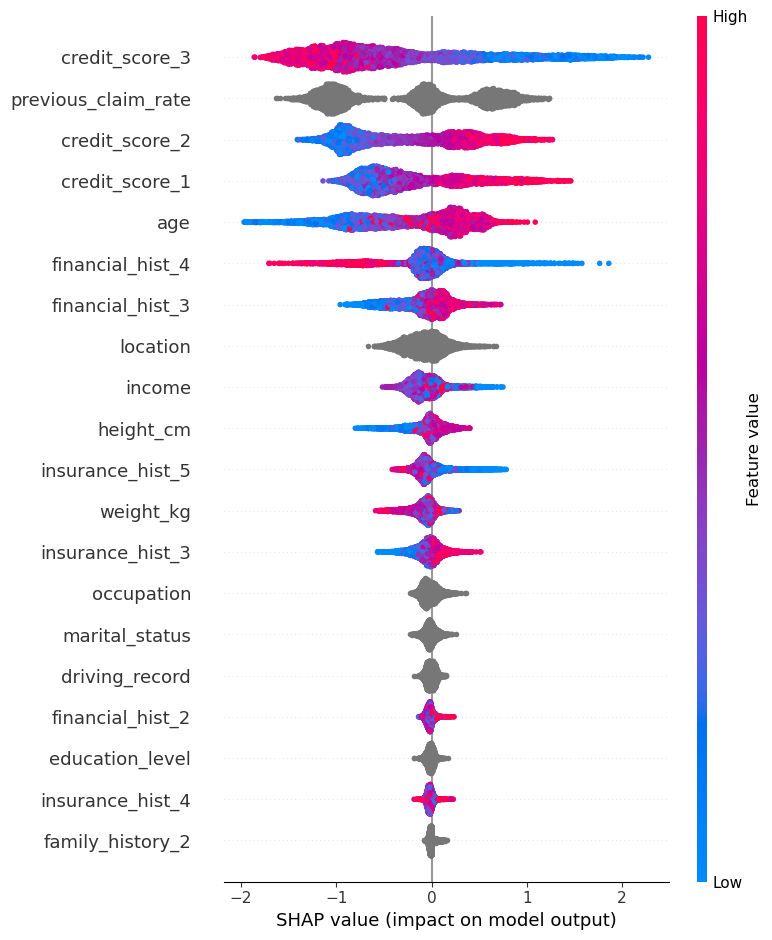

In [32]:
shap.initjs()

shap_values = model3.get_booster().predict(
    xgb.DMatrix(X_train, y_train, enable_categorical=True), pred_contribs=True
)

native_model = model3.get_booster()
shap_values = native_model.predict(
    xgb.DMatrix(X_train, y_train, enable_categorical=True), pred_contribs=True
)

shap.summary_plot(shap_values[:, :-1], X_train)

### Save the model

In [33]:
import joblib
model3.save_model("xgboost_model_optimised_with_cross_validation.json")